<a href="https://colab.research.google.com/github/Pauliostar45/MSc_Machine_Learning_projects/blob/main/Individual_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **INTRODUCTION**

# **1. IMPORTS**

In [ ]:
# IMPORTS
# Core libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
# Preprocessing and Feature Engineering
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from collections import Counter
from imblearn.over_sampling import SMOTE
# Models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
# Metrics
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, confusion_matrix, classification_report, roc_curve
)
# Colab-specific for data loading
from google.colab import drive
drive.mount('/content/drive')
# Load and display settings
file_path = '/content/drive/MyDrive/BankChurners.csv'
bankChurners = pd.read_csv(file_path)
pd.set_option('display.max_columns', None)
print("Setup Complete. Data Loaded.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Setup Complete. Data Loaded.


# **2. DATA DESCRIPTION**

In [ ]:
#Figure 1: Feature Description Table
#Create a dictionary with feature names and their descriptions
feature_descriptions = {
    'Attrition_Flag': 'Internal event variable - 1 if the account is closed, else 0.',
    'Customer_Age': "Demographic variable - Customer's Age in Years.",
    'Gender': 'Demographic variable - M=Male, F=Female.',
    'Dependent_count': 'Demographic variable - Number of dependents.',
    'Education_Level': 'Demographic variable - Educational Qualification of the account holder.',
    'Marital_Status': 'Demographic variable - Married, Single, Divorced, Unknown.',
    'Income_Category': 'Demographic variable - Annual Income Category of the account holder.',
    'Card_Category': 'Product Variable - Type of Card (Blue, Silver, Gold, Platinum).',
    'Months_on_book': 'Period of relationship with the bank in months.',
    'Total_Relationship_Count': 'Total number of products held by the customer.',
    'Months_Inactive_12_mon': 'Number of months inactive in the last 12 months.',
    'Contacts_Count_12_mon': 'Number of contacts in the last 12 months.',
    'Credit_Limit': 'Credit Limit on the Credit Card.',
    'Total_Revolving_Bal': 'Total Revolving Balance on the Credit Card.',
    'Total_Trans_Amt': 'Total Transaction Amount (Last 12 months).',
    'Total_Trans_Ct': 'Total Transaction Count (Last 12 months).'
}
# Convert the dictionary to a pandas DataFrame for a clean display
features_df = pd.DataFrame(feature_descriptions.items(), columns=['Feature', 'Description'])
features_df.set_index('Feature', inplace=True)
# Display the formatted table
print("Figure 1: Summary of Key Dataset Features")
display(features_df)


Figure 1: Summary of Key Dataset Features


,Description
Feature,
Attrition_Flag,Internal event variable - 1 if the account is ...
Customer_Age,Demographic variable - Customer's Age in Years.
Gender,"Demographic variable - M=Male, F=Female."
Dependent_count,Demographic variable - Number of dependents.
Education_Level,Demographic variable - Educational Qualificati...
Marital_Status,"Demographic variable - Married, Single, Divorc..."
Income_Category,Demographic variable - Annual Income Category ...
Card_Category,"Product Variable - Type of Card (Blue, Silver,..."
Months_on_book,Period of relationship with the bank in months.


In [ ]:
bankChurners.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 23 columns):
 #   Column                                                                                                                              Non-Null Count  Dtype  
---  ------                                                                                                                              --------------  -----  
 0   CLIENTNUM                                                                                                                           10127 non-null  int64  
 1   Attrition_Flag                                                                                                                      10127 non-null  object 
 2   Customer_Age                                                                                                                        10127 non-null  int64  
 3   Gender                                                                           

In [ ]:
bankChurners['Card_Category'].unique()

array(['Blue', 'Gold', 'Silver', 'Platinum'], dtype=object)

In [ ]:
bankChurners['Education_Level'].unique()

array(['High School', 'Graduate', 'Uneducated', 'Unknown', 'College',
       'Post-Graduate', 'Doctorate'], dtype=object)

In [ ]:
bankChurners['Attrition_Flag'].unique()

array(['Existing Customer', 'Attrited Customer'], dtype=object)

In [ ]:
bankChurners['Income_Category'].unique()

array(['$60K - $80K', 'Less than $40K', '$80K - $120K', '$40K - $60K',
       '$120K +', 'Unknown'], dtype=object)

In [ ]:
bankChurners.isnull().sum()


,0
CLIENTNUM,0
Attrition_Flag,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,0
Marital_Status,0
Income_Category,0
Card_Category,0
Months_on_book,0


In [ ]:
bankChurners.describe()

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
count,1.012700e+04,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,7.391776e+08,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894,0.159997,0.840003
std,3.690378e+07,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691,0.365301,0.365301
min,7.080821e+08,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000,0.000008,0.000420
25%,7.130368e+08,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000,0.000099,0.999660
50%,7.179264e+08,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000,0.000181,0.999820
75%,7.731435e+08,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000,0.000337,0.999900
max,8.283431e+08,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000,0.999580,0.999990


*describe function only works for numerical value datasets*

# **3. DATA CLEANING / DATA PREPROCESSING**

In [ ]:
# Drop irrelevant identifier and classifier columns
bankChurners = bankChurners.drop(columns=[
    'CLIENTNUM',
    'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
    'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'
])

In [ ]:
# Figure 2: Missing & 'Unknown' Value Counts

# Re-load the original data to a temporary dataframe to ensure an accurate 'before' count
df_temp = pd.read_csv(file_path)
# BEFORE CLEANING
# Define the columns that have 'Unknown' values
categorical_cols_with_unknown = ['Education_Level', 'Marital_Status', 'Income_Category']
# Count initial 'Unknown' values from the fresh dataframe
unknown_counts_before = {col: (df_temp[col] == 'Unknown').sum() for col in categorical_cols_with_unknown}
before_df = pd.DataFrame(unknown_counts_before.items(), columns=['Feature', 'Unknown Values (Before)'])
# AFTER CLEANING (SIMULATION)
# Create another temporary copy to simulate the cleaning process
df_cleaned_temp = df_temp.copy()
# Impute 'Unknown' values with the mode
for column in categorical_cols_with_unknown:
    mode_value = df_cleaned_temp[column].mode()[0]
    df_cleaned_temp[column] = df_cleaned_temp[column].replace('Unknown', mode_value)
# Count 'Unknown' values after cleaning (which will now correctly be zero)
unknown_counts_after = {col: (df_cleaned_temp[col] == 'Unknown').sum() for col in categorical_cols_with_unknown}
after_df = pd.DataFrame(unknown_counts_after.items(), columns=['Feature', 'Unknown Values (After)'])
# COMBINE AND DISPLAY
# Merge the dataframes for a comparison table
summary_df = pd.merge(before_df, after_df, on='Feature')
summary_df.set_index('Feature', inplace=True)
print("Figure 2: Missing and 'Unknown' value counts before and after pre-processing")
display(summary_df)

Figure 2: Missing and 'Unknown' value counts before and after pre-processing


,Unknown Values (Before),Unknown Values (After)
Feature,,
Education_Level,1519,0
Marital_Status,749,0
Income_Category,1112,0


In [ ]:
# Impute 'Unknown' values with the mode to prevent data loss
for column in ['Education_Level', 'Marital_Status', 'Income_Category']:
    mode_value = bankChurners[column].mode()[0]
    bankChurners[column] = bankChurners[column].replace('Unknown', mode_value)
print("Missing values after cleaning:")
print(bankChurners.isnull().sum())

Missing values after cleaning:
Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64


In [ ]:
#Check for and show duplicates
duplicates = bankChurners[bankChurners.duplicated()]
print(f"\nNumber of duplicate rows found: {len(duplicates)}")


Number of duplicate rows found: 0


In [ ]:
for column in bankChurners.columns:
  bankChurners[column] = bankChurners[column].replace('Unknown', np.nan) # removes unknown values


In [ ]:
bankChurners.isnull().sum() # check missing values

,0
Attrition_Flag,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,0
Marital_Status,0
Income_Category,0
Card_Category,0
Months_on_book,0
Total_Relationship_Count,0


In [ ]:
# eliminate rows with any missing values
bankChurners.dropna(inplace = True)

In [ ]:
bankChurners.isnull().sum()

,0
Attrition_Flag,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,0
Marital_Status,0
Income_Category,0
Card_Category,0
Months_on_book,0
Total_Relationship_Count,0


In [ ]:
# Check for duplicates based on all columns
duplicates = bankChurners[bankChurners.duplicated(keep=False)]

print(f"Number of duplicate rows found: {len(duplicates)}")

Number of duplicate rows found: 0


In [ ]:
bankChurners.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

There is 6 categorical features and 14 numerical features

In [ ]:
bankChurners.head(30)

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Married,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
5,Existing Customer,44,M,2,Graduate,Married,$40K - $60K,Blue,36,3,1,2,4010.0,1247,2763.0,1.376,1088,24,0.846,0.311
6,Existing Customer,51,M,4,Graduate,Married,$120K +,Gold,46,6,1,3,34516.0,2264,32252.0,1.975,1330,31,0.722,0.066
7,Existing Customer,32,M,0,High School,Married,$60K - $80K,Silver,27,2,2,2,29081.0,1396,27685.0,2.204,1538,36,0.714,0.048
8,Existing Customer,37,M,3,Uneducated,Single,$60K - $80K,Blue,36,5,2,0,22352.0,2517,19835.0,3.355,1350,24,1.182,0.113
9,Existing Customer,48,M,2,Graduate,Single,$80K - $120K,Blue,36,6,3,3,11656.0,1677,9979.0,1.524,1441,32,0.882,0.144


# **4. EXPLORATORY DATA ANALYSIS**

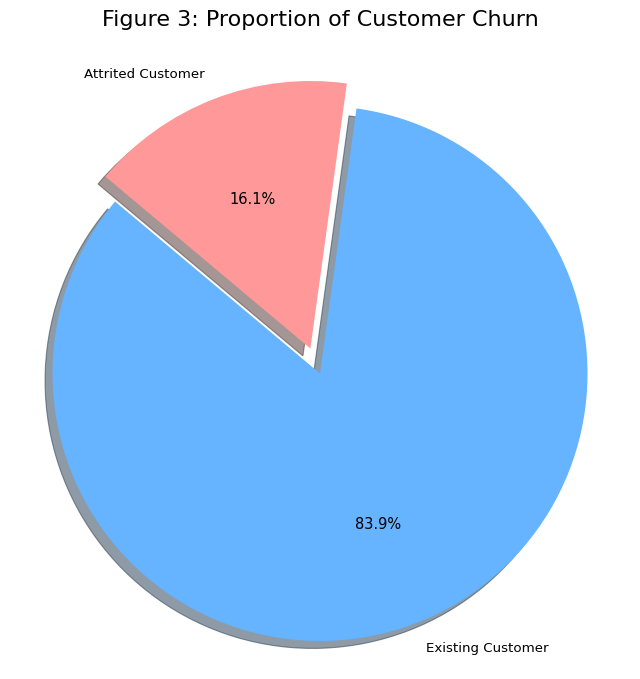

In [ ]:
#####Figure 3: Customer Churn Proportion Pie Chart

#  Re-load the raw data to ensure original text labels are available for the chart
df_temp = pd.read_csv(file_path)

# Calculate the counts for each category in the 'Attrition_Flag' column
churn_counts = df_temp['Attrition_Flag'].value_counts()

# Define the labels and corresponding sizes for the pie chart
labels = churn_counts.index
sizes = churn_counts.values

# Define colors
colors = ['#66b3ff', '#ff9999']

# Explode the 'Attrited Customer' slice for emphasis
attrited_index = list(labels).index('Attrited Customer')
explode = [0] * len(labels)
explode[attrited_index] = 0.1

# Create the pie chart
plt.figure(figsize=(8, 8))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%',
        shadow=True, startangle=140)

plt.axis('equal')
plt.title("Figure 3: Proportion of Customer Churn", size=16, pad=20)
plt.show()

Shows the data is imbalanced - problematic for training and testing when predicting model performance

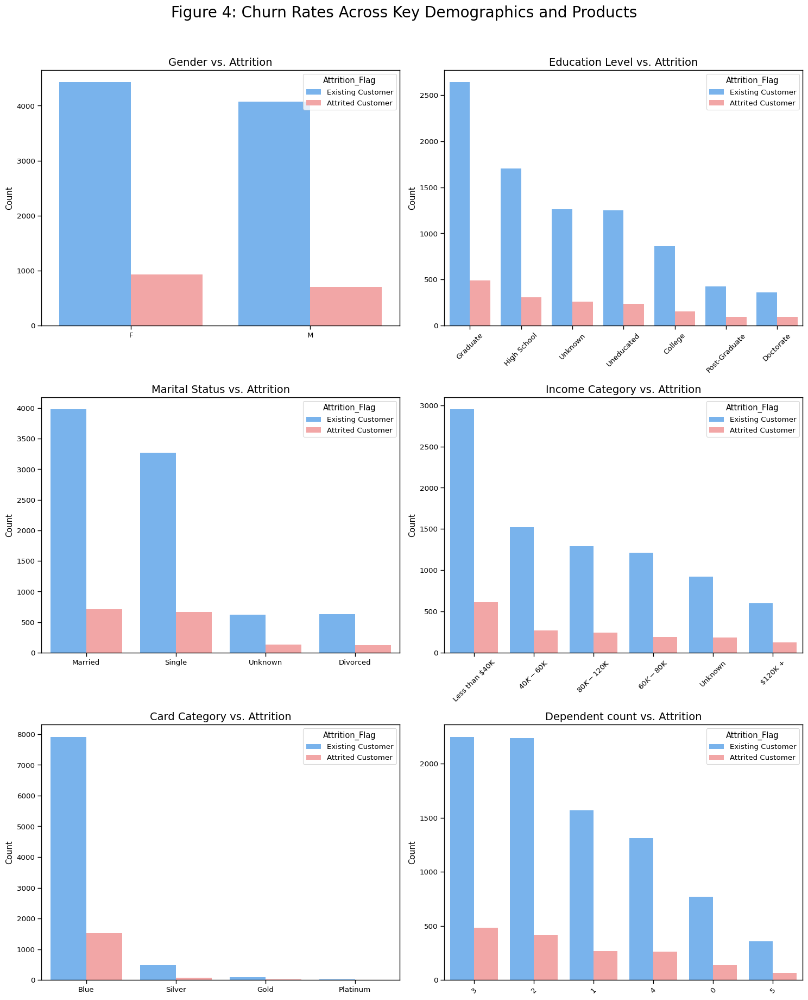

In [ ]:
# Figure 4: Bar Charts for Categorical Features vs. Churn

# Re-load the original data to ensure original text labels are available
df_temp = pd.read_csv(file_path)

# Define the categorical columns to plot
categorical_features = ['Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category', 'Dependent_count']

# Create a 3x2 grid of subplots
fig, axes = plt.subplots(3, 2, figsize=(15, 18))
axes = axes.flatten() # Flattern the 2D array of axes to easily iterate

# Define a consistent color palette
palette = {"Existing Customer": "#66b3ff", "Attrited Customer": "#ff9999"}

for i, col in enumerate(categorical_features):
    sns.countplot(x=col, hue='Attrition_Flag', data=df_temp, ax=axes[i], palette=palette, order = df_temp[col].value_counts().index)
    axes[i].set_title(f'{col.replace("_", " ")} vs. Attrition', fontsize=14)
    axes[i].set_xlabel('') # Remove individual x-labels for a cleaner look
    axes[i].set_ylabel('Count')
    # Rotate x-axis labels for better readability if needed
    if df_temp[col].nunique() > 4:
        axes[i].tick_params(axis='x', rotation=45)

# If theres an odd number of plots, you can hide the last empty subplot
if len(categorical_features) < len(axes):
    for j in range(len(categorical_features), len(axes)):
        axes[j].axis('off')

plt.suptitle('Figure 4: Churn Rates Across Key Demographics and Products', fontsize=20, y=1.02)
plt.tight_layout()
plt.show()

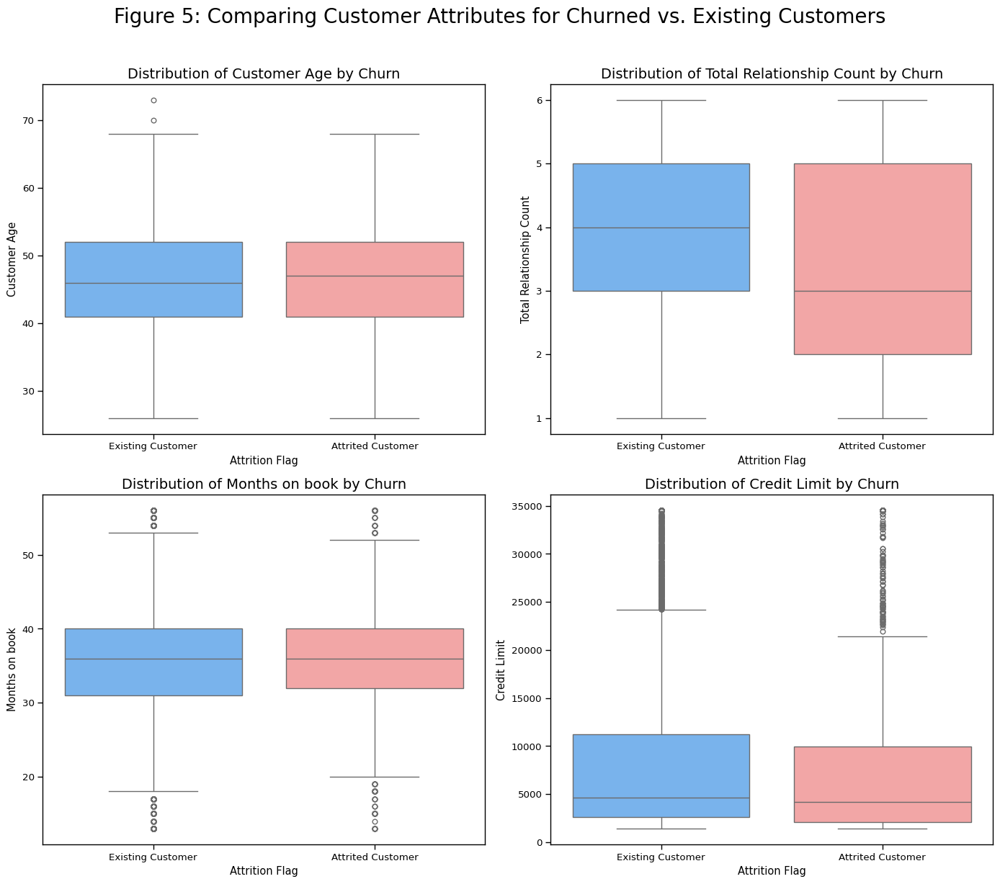

In [ ]:
#### Figure 5: Box Plots for Numerical Features vs. Churn

# Re-load the original data
df_temp = pd.read_csv(file_path)

# Define the numerical columns to plot
numerical_features = ['Customer_Age', 'Total_Relationship_Count', 'Months_on_book', 'Credit_Limit']

# Create a 2x2 grid of subplots
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.flatten()

# Define a consistent color palette
palette = {"Existing Customer": "#66b3ff", "Attrited Customer": "#ff9999"}

for i, col in enumerate(numerical_features):
    sns.boxplot(x='Attrition_Flag', y=col, data=df_temp, ax=axes[i], palette=palette)
    axes[i].set_title(f'Distribution of {col.replace("_", " ")} by Churn', fontsize=14)
    axes[i].set_xlabel('Attrition Flag')
    axes[i].set_ylabel(col.replace("_", " "))

plt.suptitle('Figure 5: Comparing Customer Attributes for Churned vs. Existing Customers', fontsize=20, y=1.02)
plt.tight_layout()
plt.show()




*   O represent retained customers and 1 represents churned customers.
*   Gender does not influence churn
*   For Card Category, the 'Blue' card category has the overwhelming majority of both existing and churned customers.
*   for education level indicates Graduate are more likely to churn.
*   customers making less than 40k a year are the most like to churn in the income category.






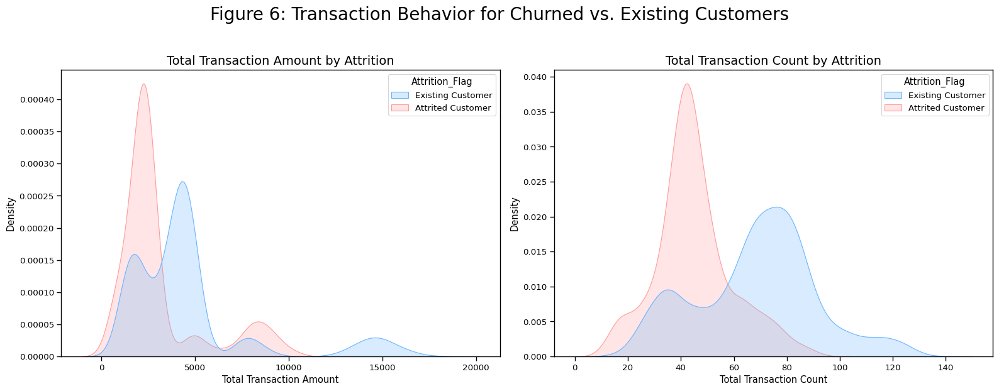

In [ ]:
# Figure 6: Density Plots for Transaction Features vs. Churn
# Re-load the original data to ensure original text labels are available
df_temp = pd.read_csv(file_path)
# Create a 1x2 grid of subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
# Define a consistent color palette
palette = {"Existing Customer": "#66b3ff", "Attrited Customer": "#ff9999"}
# Plot for Total_Trans_Amt
sns.kdeplot(data=df_temp, x='Total_Trans_Amt', hue='Attrition_Flag', fill=True,
            common_norm=False, palette=palette, ax=axes[0])
axes[0].set_title('Total Transaction Amount by Attrition', fontsize=14)
axes[0].set_xlabel('Total Transaction Amount')
axes[0].set_ylabel('Density')
# Plot for Total_Trans_Ct
sns.kdeplot(data=df_temp, x='Total_Trans_Ct', hue='Attrition_Flag', fill=True,
            common_norm=False, palette=palette, ax=axes[1])
axes[1].set_title('Total Transaction Count by Attrition', fontsize=14)
axes[1].set_xlabel('Total Transaction Count')
axes[1].set_ylabel('Density')
plt.suptitle('Figure 6: Transaction Behavior for Churned vs. Existing Customers', fontsize=20, y=1.03)
plt.tight_layout()
plt.show()

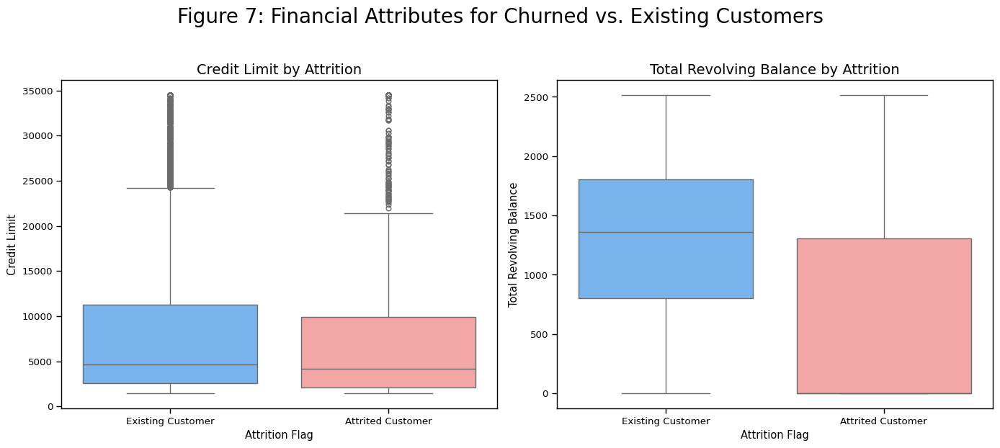

In [ ]:
###Figure 7: Box Plots for Financial Attributes vs. Churn

### Re-load the original data
df_temp = pd.read_csv(file_path)

## Create a 1x2 grid of subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

## Define a consistent color palette
palette = {"Existing Customer": "#66b3ff", "Attrited Customer": "#ff9999"}

# Plot for Credit_Limit
sns.boxplot(x='Attrition_Flag', y='Credit_Limit', data=df_temp, ax=axes[0], palette=palette)
axes[0].set_title('Credit Limit by Attrition', fontsize=14)
axes[0].set_xlabel('Attrition Flag')
axes[0].set_ylabel('Credit Limit')

# Plot for Total_Revolving_Bal
sns.boxplot(x='Attrition_Flag', y='Total_Revolving_Bal', data=df_temp, ax=axes[1], palette=palette)
axes[1].set_title('Total Revolving Balance by Attrition', fontsize=14)
axes[1].set_xlabel('Attrition Flag')
axes[1].set_ylabel('Total Revolving Balance')

plt.suptitle('Figure 7: Financial Attributes for Churned vs. Existing Customers', fontsize=20, y=1.03)
plt.tight_layout()
plt.show()

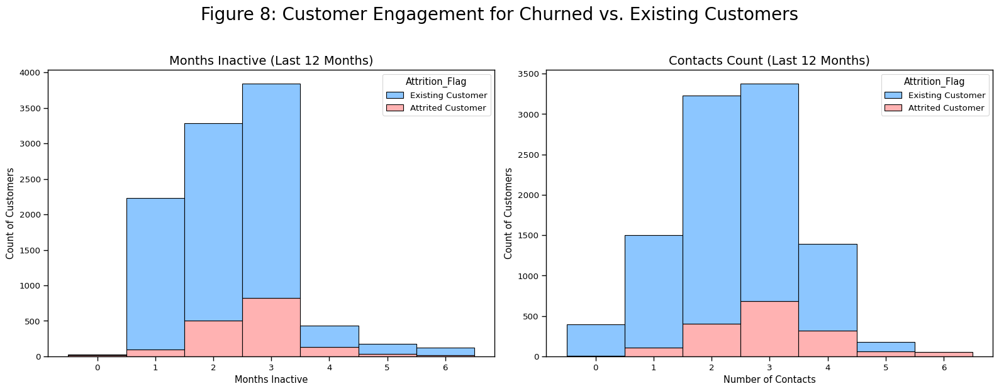

In [ ]:
### Figure 8: Histograms for Customer Engagement vs. Churn

# Re-load the original data
df_temp = pd.read_csv(file_path)

# Create a 1x2 grid of subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Define a consistent color palette
palette = {"Existing Customer": "#66b3ff", "Attrited Customer": "#ff9999"}

# Plot for Months_Inactive_12_mon
sns.histplot(data=df_temp, x='Months_Inactive_12_mon', hue='Attrition_Flag', multiple="stack",
             palette=palette, ax=axes[0], discrete=True)
axes[0].set_title('Months Inactive (Last 12 Months)', fontsize=14)
axes[0].set_xlabel('Months Inactive')
axes[0].set_ylabel('Count of Customers')

# Plot for Contacts_Count_12_mon
sns.histplot(data=df_temp, x='Contacts_Count_12_mon', hue='Attrition_Flag', multiple="stack",
             palette=palette, ax=axes[1], discrete=True)
axes[1].set_title('Contacts Count (Last 12 Months)', fontsize=14)
axes[1].set_xlabel('Number of Contacts')
axes[1].set_ylabel('Count of Customers')

plt.suptitle('Figure 8: Customer Engagement for Churned vs. Existing Customers', fontsize=20, y=1.03)
plt.tight_layout()
plt.show()



*   'Total_Trans_Ct', 'Total_Trans_Amt', 'Total_Revolving_Bal' depict relatively strong postive correlations with 'Attrition_Flag', suggesting that higher transaction amounts, and revolving balances are less likely to churn and vice versa.


*   Features such as 'Gender', 'Educatonal_level', Income_Category display weaker correlations with the 'Attrition_flag' compared to the transaction-related features.





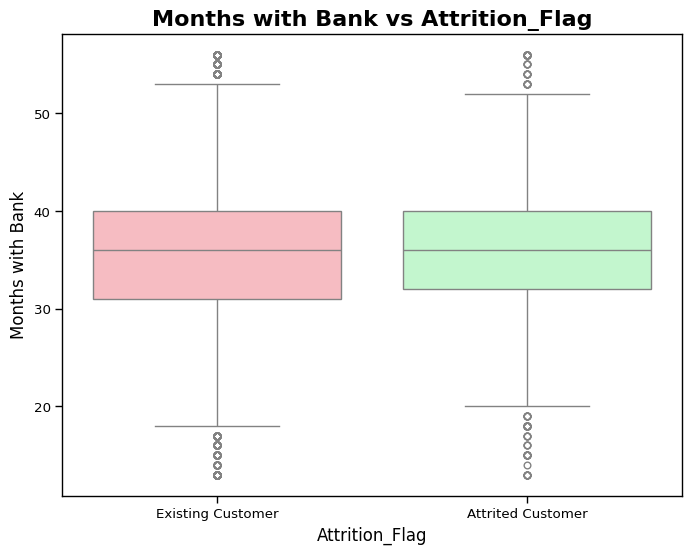

In [ ]:
custom_pastels = ['#FFB3BA', '#BAFFC9']
plt.figure(figsize=(8, 6))
sns.boxplot(data=bankChurners, x='Attrition_Flag', y='Months_on_book', palette= custom_pastels)

# Customize the plot
plt.title('Months with Bank vs Attrition_Flag', fontsize=16, fontweight='bold')
plt.xlabel('Attrition_Flag', fontsize=12)
plt.ylabel('Months with Bank', fontsize=12)

plt.show()


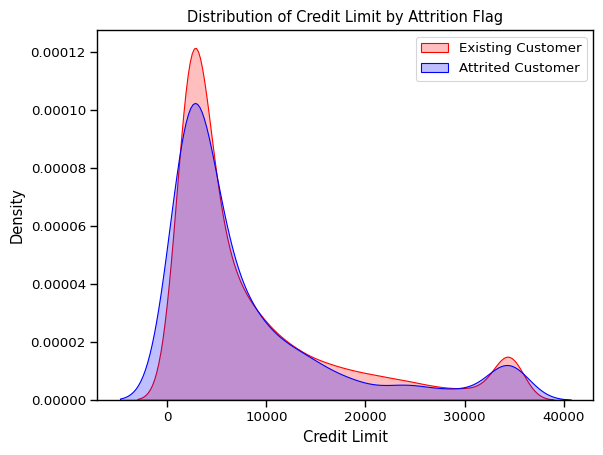

In [ ]:
# Replaced 'shade=True' with 'fill=True' and added labels
sns.set_context("paper",font_scale=1.1)
ax = sns.kdeplot(bankChurners.Credit_Limit[(bankChurners["Attrition_Flag"] == 'Existing Customer') ],
               color="Red", fill = True, label='Existing Customer');
ax = sns.kdeplot(bankChurners.Credit_Limit[(bankChurners["Attrition_Flag"] == 'Attrited Customer') ],
                ax =ax, color="Blue", fill= True, label='Attrited Customer');
ax.legend(loc='upper right');
ax.set_ylabel('Density');
ax.set_xlabel('Credit Limit');
ax.set_title('Distribution of Credit Limit by Attrition Flag');

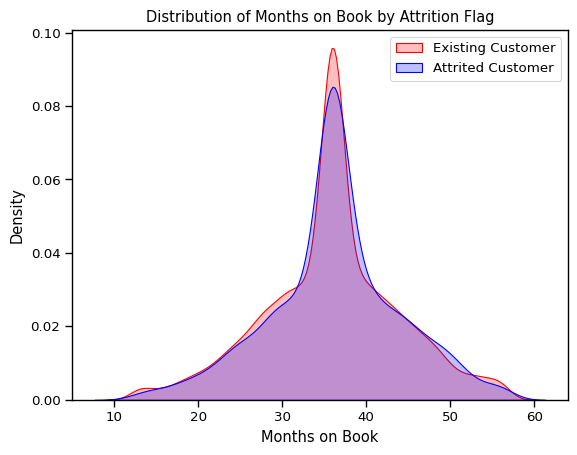

In [ ]:
# Replaced 'shade=True' with 'fill=True' and added labels
sns.set_context("paper",font_scale=1.1)
ax = sns.kdeplot(bankChurners.Months_on_book[(bankChurners["Attrition_Flag"] == 'Existing Customer') ],
             color="Red", fill = True, label='Existing Customer');
ax = sns.kdeplot(bankChurners.Months_on_book[(bankChurners["Attrition_Flag"] == 'Attrited Customer') ],
              ax =ax, color="Blue", fill= True, label='Attrited Customer');
ax.legend(loc='upper right');
ax.set_ylabel('Density');
ax.set_xlabel('Months on Book');
ax.set_title('Distribution of Months on Book by Attrition Flag');

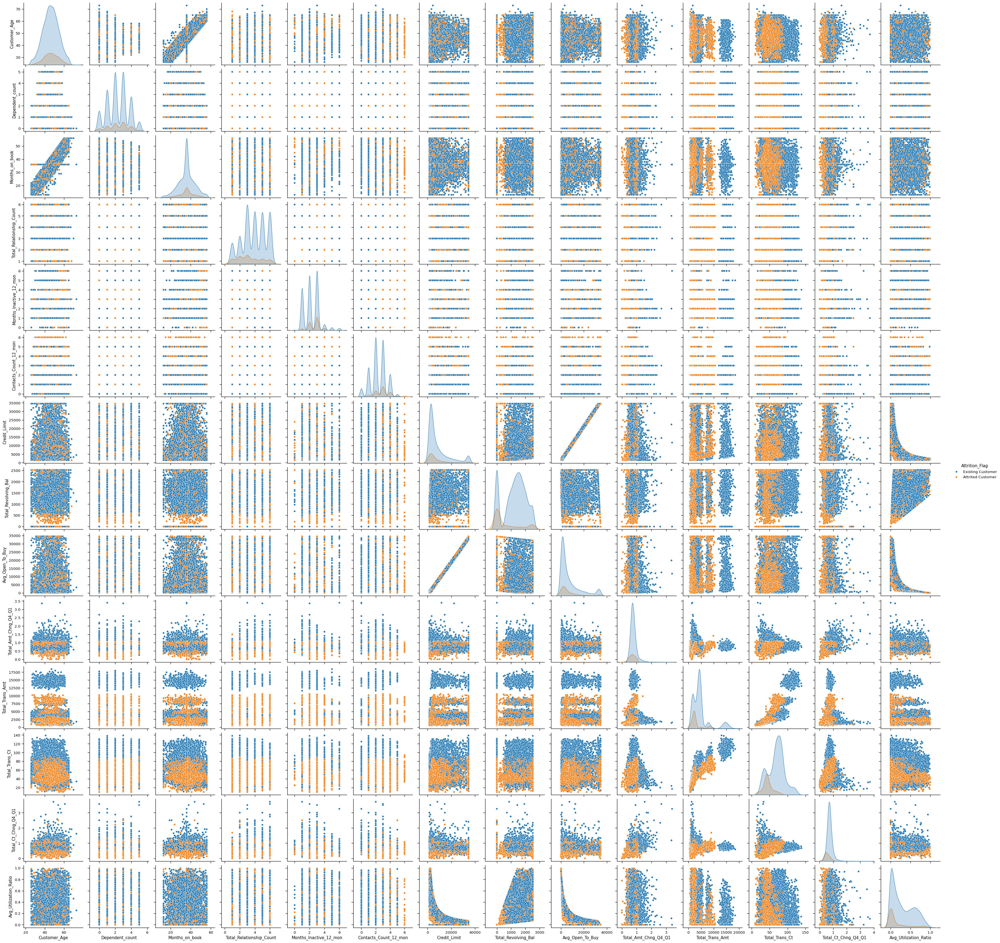

In [ ]:
sns.pairplot(bankChurners, hue='Attrition_Flag')

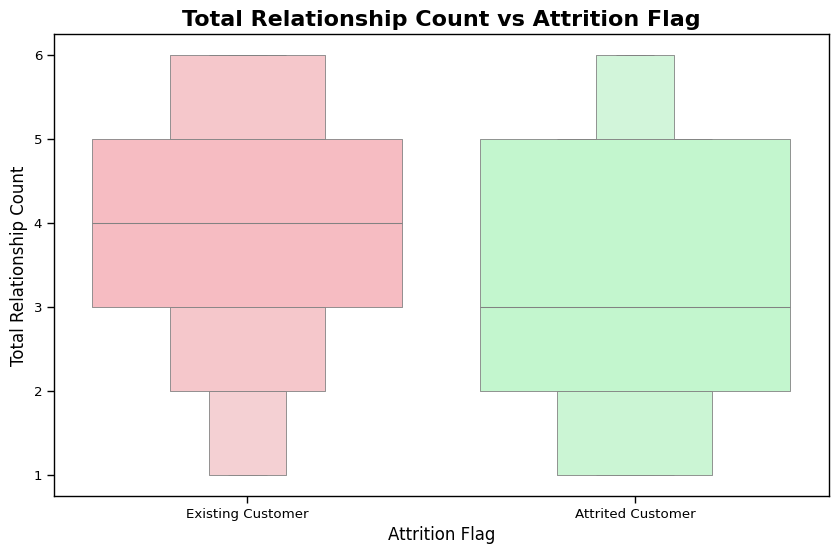

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxenplot(data=bankChurners, x='Attrition_Flag', y='Total_Relationship_Count', palette=('#FFB3BA', '#BAFFC9'))
plt.title('Total Relationship Count vs Attrition Flag', fontsize=16, fontweight='bold')
plt.xlabel('Attrition Flag', fontsize=12)
plt.ylabel('Total Relationship Count', fontsize=12)
plt.show()

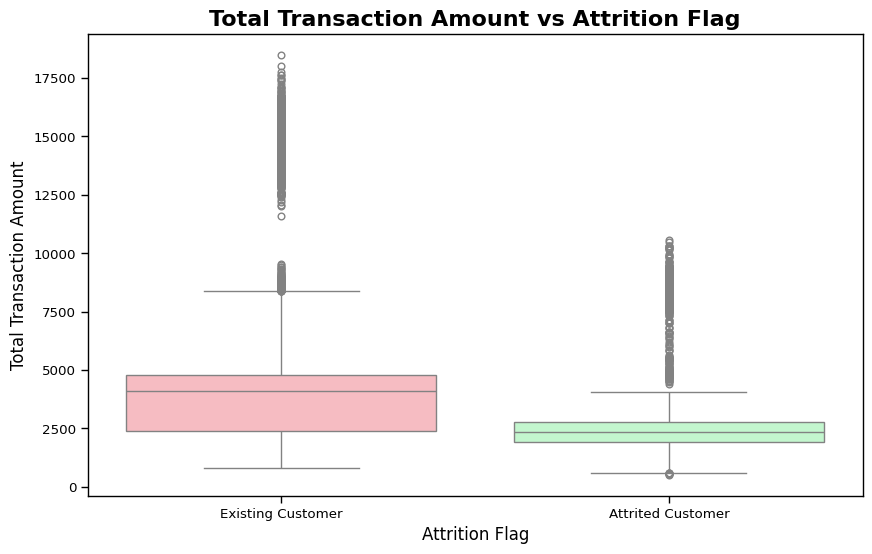

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=bankChurners, x='Attrition_Flag', y='Total_Trans_Amt', palette=('#FFB3BA', '#BAFFC9'))
plt.title('Total Transaction Amount vs Attrition Flag', fontsize=16, fontweight='bold')
plt.xlabel('Attrition Flag', fontsize=12)
plt.ylabel('Total Transaction Amount', fontsize=12)
plt.show()

# **5. DATA FEATURING ENGINEERING**

In [ ]:
### 5. DATA FEATURING ENGINEERING

### Convert target variable 'Attrition_Flag' to binary
bankChurners['Attrition_Flag'] = bankChurners['Attrition_Flag'].map({'Existing Customer': 0, 'Attrited Customer': 1})
# Feature Selection (Keep as before)
low_corr_features = ['Avg_Open_To_Buy', 'Customer_Age']
bankChurners.drop(columns=low_corr_features, inplace=True)
# Split the data into features (X) and target (y)
X = bankChurners.drop('Attrition_Flag', axis=1)
y = bankChurners['Attrition_Flag']
## Split the data into training and testing sets FIRST
# This is the most critical change. The test set is now held out.
X_train_orig, X_test_orig, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
print(f"Shape of original training set: {X_train_orig.shape}")
print(f"Shape of original test set: {X_test_orig.shape}")
print(f"Original training class distribution: {Counter(y_train)}")
# Preprocessing
# detect categorical and numerical features apllied to the training set
categorical_cols = X_train_orig.select_dtypes(include=['object']).columns.tolist()
numerical_cols = X_train_orig.select_dtypes(include=['int64', 'float64']).columns.tolist()
# Create the preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols),
        ('cat', OneHotEncoder(drop='first', handle_unknown='ignore'), categorical_cols)
    ])
# Fit the preprocessor on the training data and transform both sets
X_train_processed = preprocessor.fit_transform(X_train_orig)
X_test_processed = preprocessor.transform(X_test_orig) ### Use .transform() only on the test set
# Resampling with SMOTE
# Apply SMOTE ONLY to the processed training data
print("\nApplying SMOTE to the training data...")
smote = SMOTE(sampling_strategy='auto', random_state=65)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_processed, y_train)
print(f"Class distribution after SMOTE on training data: {Counter(y_train_resampled)}")
X_train = X_train_resampled
y_train = y_train_resampled
X_test = X_test_processed


Shape of original training set: (8101, 17)
Shape of original test set: (2026, 17)
Original training class distribution: Counter({0: 6799, 1: 1302})

Applying SMOTE to the training data...
Class distribution after SMOTE on training data: Counter({0: 6799, 1: 6799})


# **6. MODELS**

In [ ]:
# Set seed for reproducibility
np.random.seed(30)

In [ ]:
# Function to evaluate model performance
def evaluate_model(model, X_test, y_test, model_name):
    # Make predictions
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    # Classification metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    conf_matrix = confusion_matrix(y_test, y_pred)
    # Print metrics
    print(f"\n--- {model_name} Performance ---")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print(f"ROC-AUC: {roc_auc:.4f}")
    print("\nConfusion Matrix:")
    print(conf_matrix)
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))
    # Plot ROC Curve
    plt.figure(figsize=(10, 6))
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {model_name}')
    plt.legend(loc='lower right')
    plt.show()
    # Plot Confusion Matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Not Churned', 'Churned'],
                yticklabels=['Not Churned', 'Churned'])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix - {model_name}')
    plt.show()
    # Return metrics for comparison
    return {
        'Model': model_name,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'ROC-AUC': roc_auc
    }

In [ ]:
# Initialize results list for storing metrics
model_results = []

In [ ]:
import imblearn
from collections import Counter
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

## ***LOGISTIC REGRESSION MODEL***


=== Training Neural Logistic Regression Model ===

--- Logistic Regression Performance ---
Accuracy: 0.8593
Precision: 0.5413
Recall: 0.8062
F1 Score: 0.6477
ROC-AUC: 0.9205

Confusion Matrix:
[[1479  222]
 [  63  262]]

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.87      0.91      1701
           1       0.54      0.81      0.65       325

    accuracy                           0.86      2026
   macro avg       0.75      0.84      0.78      2026
weighted avg       0.89      0.86      0.87      2026



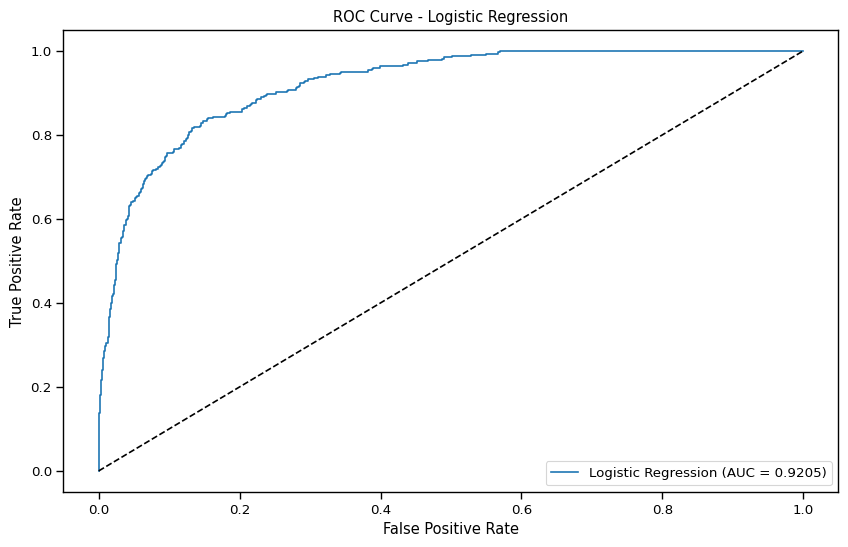

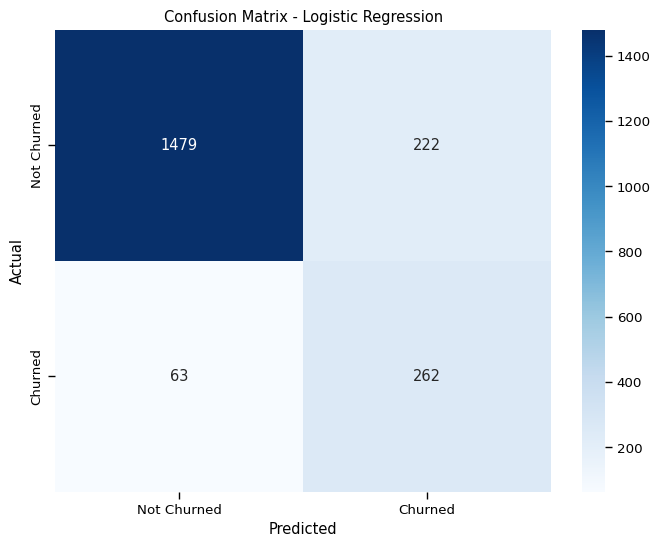

In [ ]:
print("\n=== Training Neural Logistic Regression Model ===")
log_regression = LogisticRegression(class_weight = 'balanced', max_iter=1000, random_state=65)
# Train the model
log_regression.fit(X_train, y_train)
# Evaluate the model
log_regression_results = evaluate_model(log_regression, X_test, y_test, "Logistic Regression")
model_results.append(log_regression_results)

## ***RANDOM FOREST MODEL***


=== Training Random Forest Model ===

--- Random Forest Performance ---
Accuracy: 0.9531
Precision: 0.8783
Recall: 0.8215
F1 Score: 0.8490
ROC-AUC: 0.9832

Confusion Matrix:
[[1664   37]
 [  58  267]]

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1701
           1       0.88      0.82      0.85       325

    accuracy                           0.95      2026
   macro avg       0.92      0.90      0.91      2026
weighted avg       0.95      0.95      0.95      2026



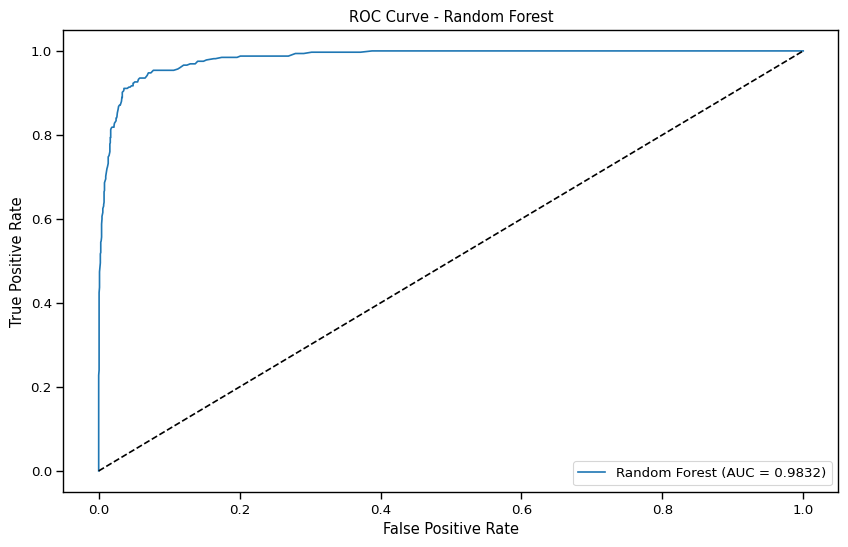

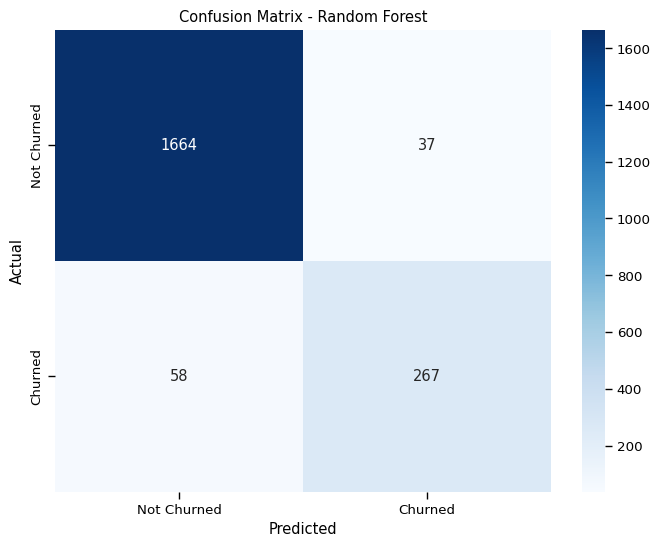

In [ ]:
# Train Random Forest
print("\n=== Training Random Forest Model ===")
rf_model = RandomForestClassifier(
    n_estimators=200,
    class_weight='balanced',  # Extra protection against imbalance
    random_state=30,
    n_jobs=-1
)
rf_model.fit(X_train, y_train)
# Evaluate
random_forest_results = evaluate_model(rf_model, X_test, y_test, "Random Forest")
model_results.append(random_forest_results)

## ***EXTREME GRADIENT BOOST***


=== Training XGBoost Model ===

--- XGBoost Performance ---
Accuracy: 0.9645
Precision: 0.8991
Recall: 0.8769
F1 Score: 0.8879
ROC-AUC: 0.9900

Confusion Matrix:
[[1669   32]
 [  40  285]]

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1701
           1       0.90      0.88      0.89       325

    accuracy                           0.96      2026
   macro avg       0.94      0.93      0.93      2026
weighted avg       0.96      0.96      0.96      2026



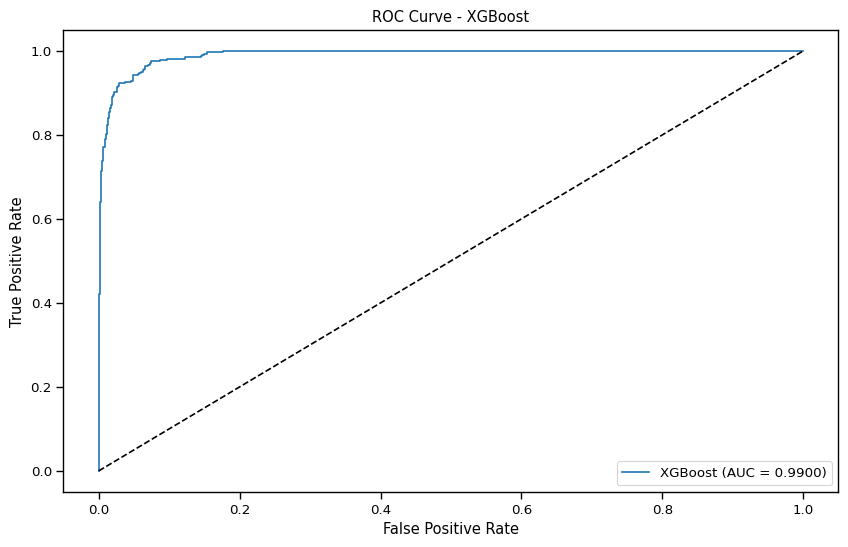

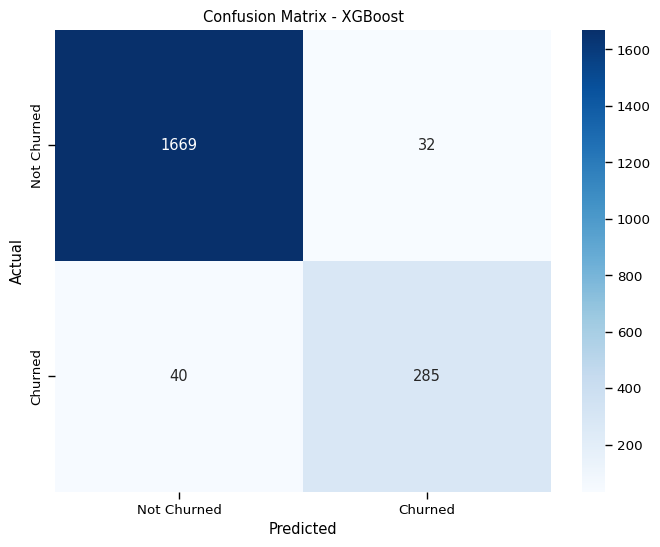

In [ ]:
# XGBoost
print("\n=== Training XGBoost Model ===")
xgb = XGBClassifier(n_estimators=100, learning_rate=0.1, random_state=30)
# Train the model
xgb.fit(X_train, y_train)
# Evaluate the model
xgb_results = evaluate_model(xgb, X_test, y_test, "XGBoost")
model_results.append(xgb_results)

# **7. MODEL COMPARISON**



=== Model Performance Comparison ===
                     Accuracy  Precision  Recall  F1 Score  ROC-AUC
Model                                                              
Logistic Regression    0.8593     0.5413  0.8062    0.6477   0.9205
Random Forest          0.9531     0.8783  0.8215    0.8490   0.9832
XGBoost                0.9645     0.8991  0.8769    0.8879   0.9900


<Figure size 600x600 with 0 Axes>

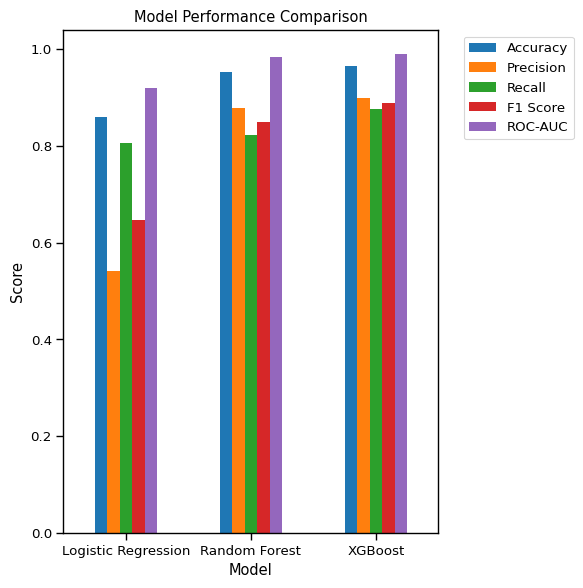

In [ ]:
# Create comparison table of all models
comparison_df = pd.DataFrame(model_results)
comparison_df = comparison_df.set_index('Model')
comparison_df = comparison_df.round(4)
print("\n=== Model Performance Comparison ===")
print(comparison_df)
# Plot comparison of metrics
plt.figure(figsize=(6, 6))
comparison_df.plot(kind='bar', figsize=(6, 6))
plt.title('Model Performance Comparison')
plt.ylabel('Score')
plt.xticks(rotation=0)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

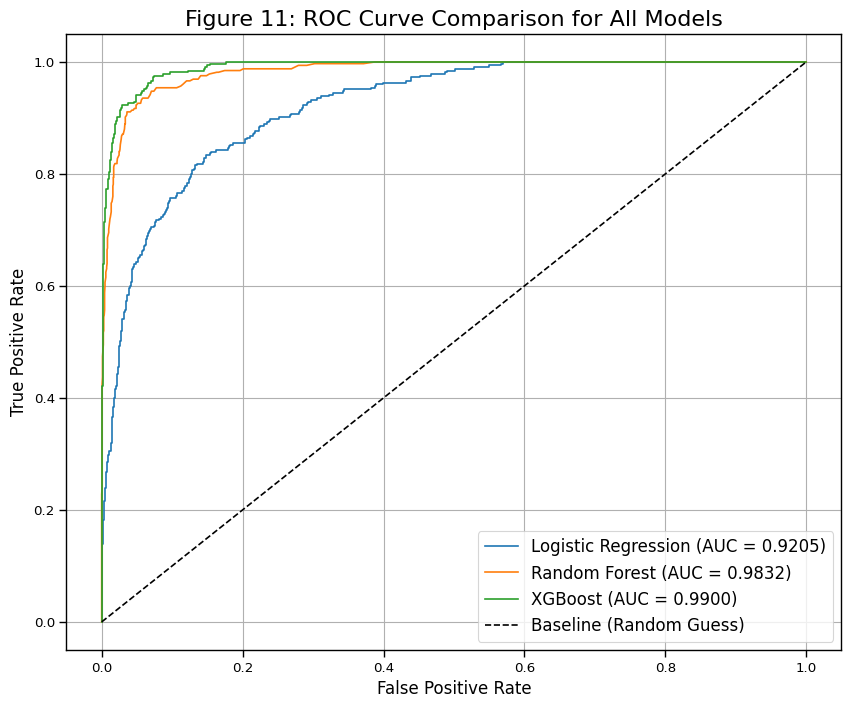

In [ ]:
# Figure 11: Combined ROC Curve Comparison Plot
# Set up the plot
plt.figure(figsize=(10, 8))
# Logistic Regression
y_pred_proba_log = log_regression.predict_proba(X_test)[:, 1]
fpr_log, tpr_log, _ = roc_curve(y_test, y_pred_proba_log)
auc_log = roc_auc_score(y_test, y_pred_proba_log)
plt.plot(fpr_log, tpr_log, label=f'Logistic Regression (AUC = {auc_log:.4f}')
# Random Forest
y_pred_proba_rf = rf_model.predict_proba(X_test)[:, 1]
fpr_rf, tpr_rf, _ = roc_curve(y_test, y_pred_proba_rf)
auc_rf = roc_auc_score(y_test, y_pred_proba_rf)
plt.plot(fpr_rf, tpr_rf, label=f'Random Forest (AUC = {auc_rf:.4f})')
# XGBoost
y_pred_proba_xgb = xgb.predict_proba(X_test)[:, 1]
fpr_xgb, tpr_xgb, _ = roc_curve(y_test, y_pred_proba_xgb)
auc_xgb = roc_auc_score(y_test, y_pred_proba_xgb)
plt.plot(fpr_xgb, tpr_xgb, label=f'XGBoost (AUC = {auc_xgb:.4f})')
# Plot Customization
# Plot the baseline (random guess) line
plt.plot([0, 1], [0, 1], 'k--', label='Baseline (Random Guess)')
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.title('Figure 11: ROC Curve Comparison for All Models', fontsize=16)
plt.legend(loc='lower right', fontsize=12)
plt.grid(True)
plt.show()

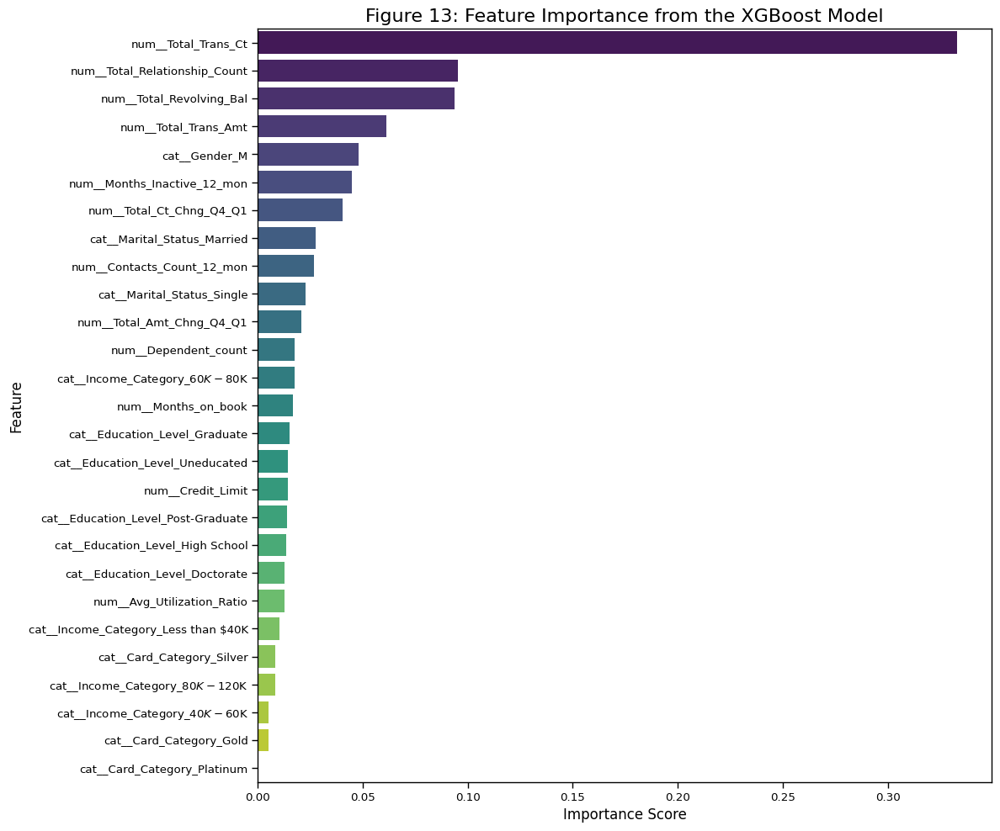

In [ ]:
# Figure 13: Feature Importance Plot from XGBoost
# The model is trained, now we extract the feature importances
importances = xgb.feature_importances_
# Get the feature names from the preprocessor
# This includes the original numerical columns and the new one-hot encoded columns
feature_names = preprocessor.get_feature_names_out()
# Create a pandas DataFrame for easier plotting
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)
# Plot the feature importances
plt.figure(figsize=(12, 10))
sns.barplot(x='Importance', y='Feature', data=importance_df, palette='viridis')
plt.title('Figure 13: Feature Importance from the XGBoost Model', fontsize=16)
plt.xlabel('Importance Score', fontsize=12)
plt.ylabel('Feature', fontsize=12)
plt.tight_layout()
plt.show()

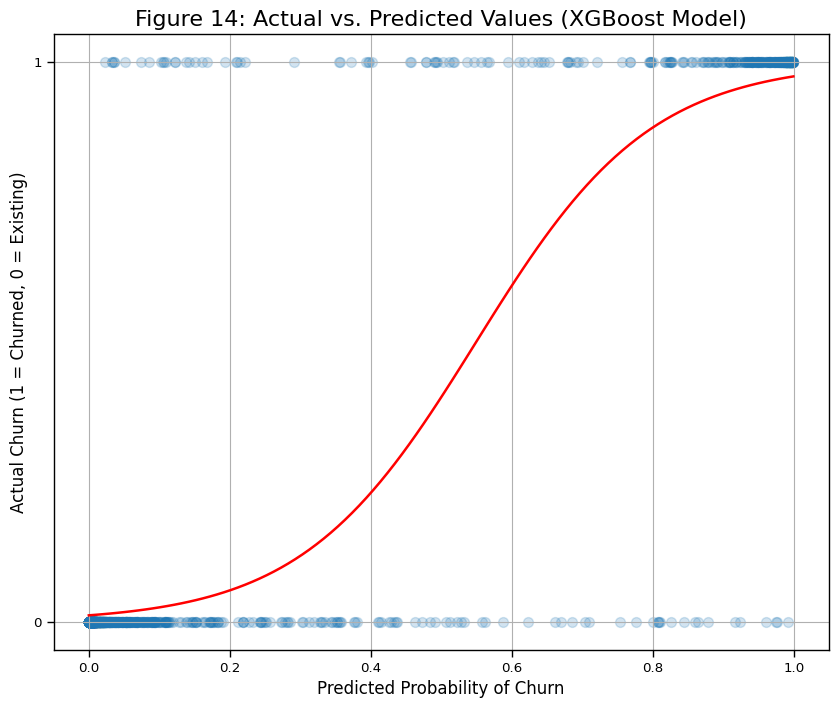

In [ ]:

# Get the predicted probabilities for the positive class (Churn) from the XGBoost model
predicted_probabilities = xgb.predict_proba(X_test)[:, 1]

# Create a DataFrame for easy plotting
results_df = pd.DataFrame({
    'Actual Values': y_test,
    'Predicted Probabilities': predicted_probabilities
})
# Create the scatter plot with a regression line
plt.figure(figsize=(10, 8))
sns.regplot(
    x='Predicted Probabilities',
    y='Actual Values',
    data=results_df,
    logistic=True,  # Use a logistic regression line, perfect for probabilities
    ci=None,        # Do not show the confidence interval
    scatter_kws={'alpha': 0.2, 's': 50}, # Make points semi-transparent
    line_kws={'color': 'red'}
)
plt.title('Figure 14: Actual vs. Predicted Values (XGBoost Model)', fontsize=16)
plt.xlabel('Predicted Probability of Churn', fontsize=12)
plt.ylabel('Actual Churn (1 = Churned, 0 = Existing)', fontsize=12)
plt.yticks([0, 1])
plt.grid(True)
plt.show()